In [4]:
import time

import pandas as pd
import numpy as np

import seaborn as sns
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from tqdm import tqdm
import glob
from collections import Counter
from concurrent.futures import ThreadPoolExecutor

In [5]:
# NLP libs
import re
import nltk
from nltk import word_tokenize, regexp_tokenize
from nltk.corpus import stopwords
import transformers
import spacy
import simplemma
import flair
from flair.data import Sentence
from syntok.tokenizer import Tokenizer
import gensim
import gensim.corpora as corpora
from gensim.models import FastText, KeyedVectors
from gensim.models.callbacks import CallbackAny2Vec
from gensim.models.ldamodel import LdaModel
import sentence_transformers
from wordcloud import WordCloud
from sklearn.feature_extraction.text import *
from sklearn.decomposition import LatentDirichletAllocation, NMF

import pyLDAvis
import pyLDAvis.sklearn

In [6]:
tqdm.pandas()

In [7]:
merged_dataset = pd.read_csv('../results/translated_merged_dataset.csv', index_col=0, lineterminator='\n')
merged_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 42019 entries, 4 to 1286
Data columns (total 7 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   title             42019 non-null  object
 1   description       38891 non-null  object
 2   responsibilities  30850 non-null  object
 3   qualifications    40602 non-null  object
 4   company           42019 non-null  object
 5   publish_date      41165 non-null  object
 6   merged_info       42019 non-null  object
dtypes: object(7)
memory usage: 2.6+ MB


In [8]:
merged_dataset.sample(5)

,title,description,responsibilities,qualifications,company,publish_date,merged_info
1427,Revenue Senior Finance Manager,MicrosoftCustomer and PartnerSolutions (MCAPS)...,Responsibilities Prioritize: Performs analysis...,Required / Minimum Qualifications: Bachelor's ...,Microsoft,2022-07-27 06:40:00,Revenue Senior Finance Manager ; MicrosoftCust...
3535,Project Manager - Talent Mobility,"Imagine what you could do here. At Apple, new ...",Be a key contributor on a range of analytical ...,Self-starter who can work independently and ha...,Apple,2022-06-16,Project Manager - Talent Mobility ; Imagine wh...
3427,ASIC Design Verification Manager,"Our computational challenges are so big, compl...",Be the primary point of contact for IP and SoC...,Minimum qualifications: Bachelor's degree in C...,Google,2022-03-10 00:02:04.648,ASIC Design Verification Manager ; Our computa...
174,Business Planner - Cloud Marketing,The Business Planning & Commercial Licensing (...,"As product business planner, you will: Lead cr...",You have 5-7 years of relevant work experience...,Microsoft,2022-08-08 20:37:00,Business Planner - Cloud Marketing ; The Busin...
6583,AR / VR Software Applications Engineer,Apple's Technology Development Group is lookin...,"In this position, you will partner with our ex...",Industry experience in software development or...,Apple,2022-02-07,AR VR Software Applications Engineer ; Apple's...


In [9]:
def tokenize_text(text: str, lemmatize=True, tokenizer=Tokenizer()) -> list:
    tokens = [token.value for token in tokenizer.tokenize(text)]
    if lemmatize:
        tokens = [simplemma.lemmatize(token, lang='en').lower() if simplemma.is_known(token, lang='en') else token for token in tokens if token]
    return tokens

In [10]:
def vectorizer_preprocess(text: str) -> str:
    return re.sub(' +', ' ', re.sub(r'[^a-zA-Z\s-]', ' ', text).replace("--", '-')).strip().lower()



## Аналитика

In [11]:
list(enumerate(merged_dataset['description'].sample(5)))

[(0,
  'Job summary LOCATION FLEXIBILITY: Open to candidates within reasonable distance of any Corporate AWS office location in the US. Relocation assistance available within the US. Amazon is seeking a business to drive insights and reporting connected to Amazon Web Services (AWS) Sales. This role will contribute to developing and executing on a roadmap of analytical work to deepen our understanding of the space, and use findings to drive change that will result in better results for AWS and its customers. This role will also own building new reporting and dashboards to bring visibility to key inputs and outputs to AWS senior leaders and the broader AWS organization. This is a critical role for our team and requires outstanding business acumen, and the ability to work across various functional teams and internal partner teams. We are looking for an who is a self-starter comfortable with ambiguity, demonstrates strong attention to detail, and has the ability to work in a fast-paced and

In [13]:
fig = make_subplots(rows=4, x_title='Количество слов')
fig.add_histogram(x=merged_dataset['description'].dropna().apply(lambda x: x.split()).apply(len), row=1, col=1, name='description')
fig.add_histogram(x=merged_dataset['responsibilities'].dropna().apply(lambda x: x.split()).apply(len), row=2, col=1, name='responsibilities')
fig.add_histogram(x=merged_dataset['qualifications'].dropna().apply(lambda x: x.split()).apply(len), row=3, col=1, name='qualifications')
fig.add_histogram(x=merged_dataset['merged_info'].dropna().apply(lambda x: x.split()).apply(len), row=4, col=1, name='merged')
fig.update_layout(title_text='Длины текстовых полей (кол-ва слов)', bargap=0.2, template='plotly_white')
fig.show()

In [14]:
total_stopwords = stopwords.words('english') + merged_dataset['company'].unique().tolist() +\
                  ['sberbank', 'mt', 'corporate', 'dentistry', 'responsibility', 'g', 'work', 'good', 'know', 'employment', 'employer', 'year', 'learn', 'whss', 'p', 'job', 'offer', '-', 'qualification']
total_stopwords = list(map(lambda x: x.lower(), total_stopwords))
len(total_stopwords)

199

In [15]:
c_vectorizer = CountVectorizer(max_df=0.9, min_df=3, ngram_range=(1, 1), tokenizer=tokenize_text, preprocessor=vectorizer_preprocess, stop_words=total_stopwords)
hot_matrix = c_vectorizer.fit_transform(merged_dataset['merged_info'].dropna())
hot_matrix.shape

/home/hivaze/miniconda3/envs/text/lib/python3.8/site-packages/sklearn/feature_extraction/text.py:404: UserWarning:

Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['mama', 'mt'] not in stop_words.



(42019, 20834)

In [16]:
np_matrix = np.array(-hot_matrix.sum(0)).squeeze()
top_tokens = pd.DataFrame(c_vectorizer.get_feature_names_out()[np.argsort(np_matrix)]).rename({0: 'token'}, axis=1)
top_tokens['freq'] = -np.sort(np_matrix)
fig = px.bar(x=top_tokens.iloc[:50]['token'], y=top_tokens.iloc[:50]['freq'], title="Топ 50 слов во всех вакансиях")
fig.update_layout(template='plotly_white')
fig.show()

In [17]:
top_tokens.head(100)

,token,freq
0,team,171232
1,customer,141806
2,business,123900
3,product,92308
4,design,84309
...,...,...
95,people,19994
96,collaborate,19817
97,internal,19549
98,network,19215


In [18]:
tf_idf_matrix = TfidfTransformer().fit_transform(hot_matrix)
tf_idf_matrix.shape

(42019, 20834)

## Классическое тематическое моделирование

In [19]:
vacancies_by_company = {comp: np.argwhere((merged_dataset['company'] == comp).values)[:, 0].tolist() for comp in merged_dataset['company'].unique()}

In [20]:
def show_topics(model, doc_to_topic, feature_names, n_words = 10):
    keywords = np.array(feature_names)
    topic_keywords = []
    for topic_weights in model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))

    topics_popularity_dict = Counter(doc_to_topic.argmax(1))
    topic_doc_counts = [topics_popularity_dict[i] for i in range(model.n_components)]

    df_topic_keywords = pd.DataFrame(topic_keywords)
    df_topic_keywords.columns = ['Word '+str(i) for i in range(df_topic_keywords.shape[1])]
    df_topic_keywords.index = ['Topic '+str(i) for i in range(df_topic_keywords.shape[0])]
    df_topic_keywords.insert(0, 'Popularity', topic_doc_counts)

    return df_topic_keywords

In [21]:
def plot_topic(topics_df, topic_num):
    fig = plt.figure(figsize=(10, 8))
    fig.patch.set_facecolor('white')
    plt.imshow(WordCloud(width=1000, background_color='white', max_font_size=70, height=800)
               .generate_from_text(" ".join(topics_df.iloc[topic_num].values[1:])), interpolation="bilinear")

#### LSA (NMF на tf-idf)

In [33]:
%%time
nmf_model = NMF(n_components=70, verbose=1, tol=1e-4, max_iter=130, solver='cd')
nmf_result = nmf_model.fit_transform(tf_idf_matrix)
nmf_model.components_.shape, nmf_result.shape

violation: 1.0
violation: 0.18666003579921486
violation: 0.1313346742115918
violation: 0.09507564785936386
violation: 0.06515014677219429
violation: 0.04711654450165444
violation: 0.034433935427949064
violation: 0.026648868308770255
violation: 0.021740478459947903
violation: 0.018287407144329325
violation: 0.015752454041351137
violation: 0.01395556448585416
violation: 0.012555384092308495
violation: 0.011129781015842369
violation: 0.00996014282402217
violation: 0.009015663916782428
violation: 0.00817384733834676
violation: 0.00743547387787948
violation: 0.006785069406363428
violation: 0.006224340604788302
violation: 0.005764814162378696
violation: 0.005408212438512847
violation: 0.005098311440302662
violation: 0.004784950004713141
violation: 0.004389300427021027
violation: 0.003944074311180194
violation: 0.0034482640607456567
violation: 0.0029779241897497097
violation: 0.0025462443567914423
violation: 0.0021810008182520735
violation: 0.0018901538317910133
violation: 0.00166916547385335

((70, 20834), (42019, 70))

In [34]:
lsa_topics = show_topics(nmf_model, nmf_result, c_vectorizer.get_feature_names_out(), n_words=30)
lsa_topics.to_csv('../results/nmf-70-topics.csv', index_label='topic')
lsa_topics

,Popularity,Word 0,Word 1,Word 2,Word 3,Word 4,Word 5,Word 6,Word 7,Word 8,...,Word 20,Word 21,Word 22,Word 23,Word 24,Word 25,Word 26,Word 27,Word 28,Word 29
Topic 0,12,business,solution,insight,ability,understand,need,strategy,key,analyst,...,drive,change,grow,help,acumen,size,intelligence,shape,use,large
Topic 1,559,software,system,design,engineer,architecture,development,program,reliability,less,...,new,internship,object,scalable,service,build,java,orient,building,non
Topic 2,275,cloud,application,modernization,architect,migration,microservices,architecture,container,devops,...,migrate,openshift,containerization,cd,ci,deployment,integration,accelerator,tool,fullstack
Topic 3,578,code,system,developer,application,limitless,vital,customize,path,technology,...,development,come,hand,innovation,future,leader,success,global,client,impact
Topic 4,1147,employment,medical,disability,protect,accommodation,status,qualify,applicant,depend,...,marital,pregnancy,ancestry,affiliation,ordinance,mental,orientation,please,may,color
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Topic 65,1820,developer,service,know,development,system,develop,code,task,load,...,ci,bank,docker,monitor,decent,team,kafka,wage,plus,git
Topic 66,949,content,youtube,creator,writer,story,creative,community,train,policy,...,audience,role,learn,explore,create,manage,video,publish,instructional,producer
Topic 67,318,siri,ml,annotation,language,user,assistant,audio,play,intelligent,...,device,ask,even,million,fluency,part,intelligence,skill,response,usage
Topic 68,624,android,device,mobile,developer,app,platform,tablet,compute,everyone,...,consumer,application,power,connectivity,kotlin,user,chrome,tv,access,wearables


In [35]:
companies_topics_matrix = {}
for company in vacancies_by_company.keys():
    topic_labels = np.zeros(nmf_model.n_components, dtype=np.float32)
    counter_results = Counter(nmf_result[vacancies_by_company[company]].argmax(1)).most_common()
    topic_ids = [res[0] for res in counter_results]
    topic_freqs = [res[1] for res in counter_results]
    topic_labels[topic_ids] = topic_freqs
    companies_topics_matrix[company] = topic_labels
companies_topics_matrix = pd.DataFrame(companies_topics_matrix).T
companies_topics_matrix

,0,1,2,3,4,5,6,7,8,9,...,60,61,62,63,64,65,66,67,68,69
IBM,3.0,0.0,240.0,578.0,0.0,467.0,0.0,661.0,243.0,3.0,...,307.0,140.0,37.0,164.0,313.0,173.0,47.0,0.0,56.0,1.0
Alibaba,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,13.0,0.0,...,0.0,3.0,3.0,0.0,11.0,1.0,7.0,0.0,1.0,0.0
Google,0.0,11.0,2.0,0.0,0.0,1.0,0.0,3.0,77.0,32.0,...,12.0,33.0,383.0,0.0,5.0,34.0,229.0,9.0,308.0,64.0
MTS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,11.0,0.0,...,0.0,2.0,0.0,3.0,15.0,53.0,1.0,0.0,8.0,0.0
Ozon,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,320.0,0.0,0.0,6.0,0.0
Tencent,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,31.0,2.0,...,1.0,8.0,4.0,0.0,5.0,10.0,75.0,0.0,9.0,8.0
Apple,0.0,22.0,2.0,0.0,2.0,15.0,0.0,18.0,307.0,57.0,...,14.0,42.0,334.0,5.0,39.0,149.0,227.0,283.0,32.0,481.0
Tinkoff,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,11.0,0.0,...,0.0,1.0,1.0,0.0,1.0,66.0,3.0,0.0,4.0,0.0
Yandex,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,18.0,0.0,...,0.0,7.0,0.0,1.0,7.0,517.0,22.0,1.0,31.0,0.0
Microsoft,1.0,0.0,18.0,0.0,1144.0,0.0,0.0,0.0,89.0,56.0,...,5.0,27.0,136.0,1.0,4.0,4.0,32.0,0.0,43.0,3.0


In [36]:
hover_texts = []
for i, x in enumerate(companies_topics_matrix.index):
    topics = []
    for j, (name, row) in enumerate(lsa_topics.iterrows()):
        topics.append(
            f"<b>{name}:</b>"
            f"<br>Относительная важность: {round(companies_topics_matrix.iloc[i][j] / companies_topics_matrix.iloc[i].max(), 3)}"
            f"<br>Количество вакансий: {int(companies_topics_matrix.iloc[i][j])}"
            f"<br><b>Ключевые слова:</b>"
            f"<br>1. {row['Word 0']}"
            f"<br>2. {row['Word 1']}"
            f"<br>3. {row['Word 2']}"
            f"<br>4. {row['Word 3']}"
            f"<br>5. {row['Word 4']}"
            f"<br>6. {row['Word 5']}"
            f"<br>7. {row['Word 6']}"
            f"<br>8. {row['Word 7']}"
            f"<br>9. {row['Word 8']}"
            f"<br>10. {row['Word 9']}"
            f"<br>11. {row['Word 10']}"
            f"<br>12. {row['Word 11']}"
            f"<br>...")
    hover_texts.append(topics)
len(hover_texts)

14

In [38]:
normalized_by_max = companies_topics_matrix.values / companies_topics_matrix.values.max(1)[:, np.newaxis]
fig = go.Figure(
    go.Heatmap(z=normalized_by_max, y=companies_topics_matrix.index, colorscale='PuBu', hovertext=hover_texts,xgap = 0, ygap = 0, hoverinfo=['y', 'text'])
)
fig.update_layout(title='Распределение вакансий компаний по темам', xaxis_title='№ Тематического кластера',
                  xaxis_tickfont_size=10, coloraxis_colorbar_title_text='Важность', template='plotly_white')
fig.show()

In [39]:
fig.write_html("../results/companies_to_70_topics.html")

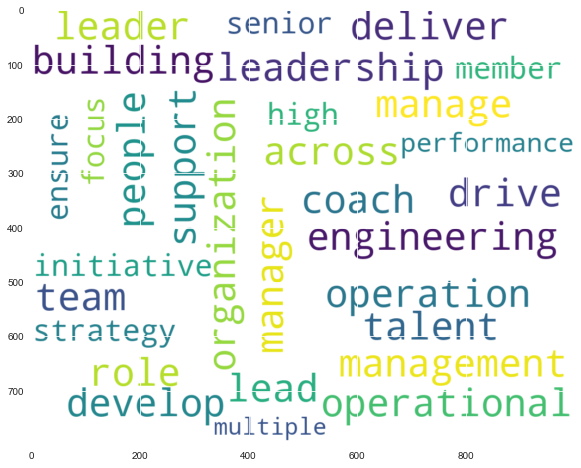

In [40]:
plot_topic(lsa_topics, 9)

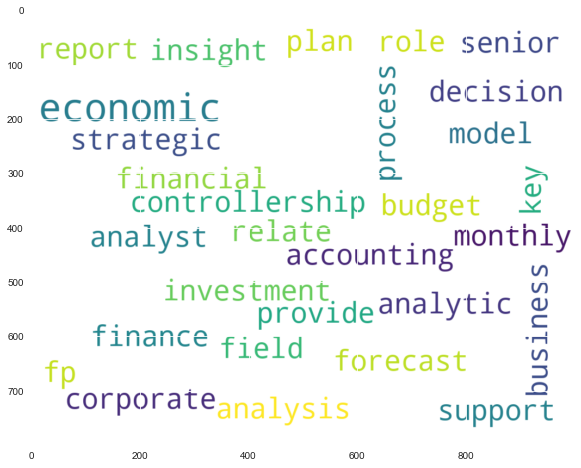

In [42]:
plot_topic(lsa_topics, 23)

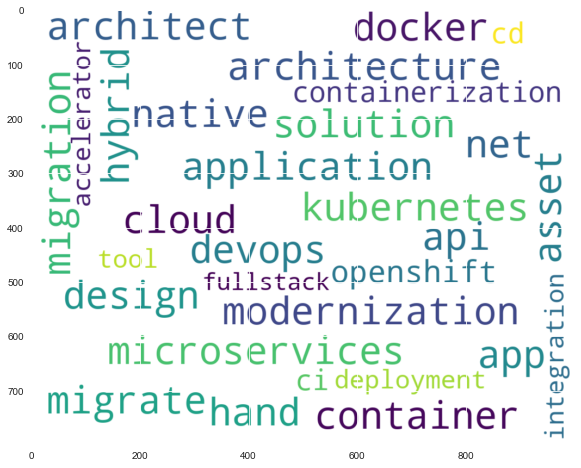

In [43]:
plot_topic(lsa_topics, 2)

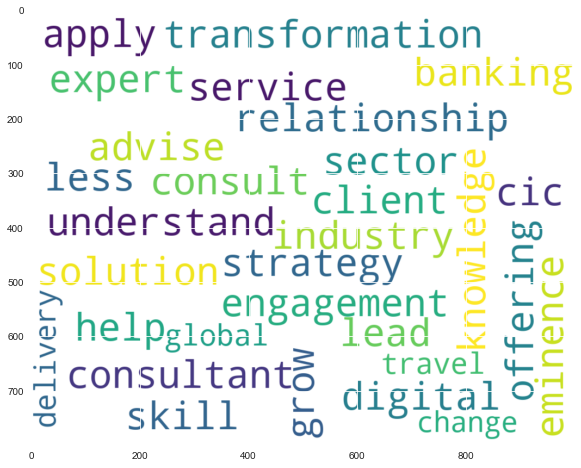

In [47]:
plot_topic(lsa_topics, 55)

## Обучение кастомного fasttext

In [48]:
documents = merged_dataset['merged_info'].dropna()
documents = documents.progress_apply(vectorizer_preprocess)
documents = documents.progress_apply(tokenize_text)

100%|██████████| 42019/42019 [01:46<00:00, 393.07it/s]


In [49]:
documents = documents.progress_apply(lambda x: filter(lambda y: y in c_vectorizer.vocabulary_.keys(), x)).apply(list)

100%|██████████| 42019/42019 [00:00<00:00, 99054.57it/s]


In [50]:
class CustomCallback(CallbackAny2Vec):
    '''Callback to print loss after each epoch.'''

    def __init__(self):
        self.epoch = 0
        self.start_time = time.time()

    def on_epoch_begin(self, model):
        print(f'Epoch {self.epoch} beggins after {time.time() - self.start_time} seconds from training start')

    def on_epoch_end(self, model):
        loss = model.get_latest_training_loss()
        print('Loss after epoch {}: {}'.format(self.epoch, loss))
        self.epoch += 1

In [ ]:
%%time
ft_model = FastText(sentences=documents, vector_size=150, window=11, sorted_vocab=True, negative=7, workers=10, sg=1, epochs=8, callbacks=[CustomCallback()])

In [83]:
ft_model.callbacks = []
ft_model.save('../models/fast-text-11-7-8-150.gensim')

In [94]:
pd.DataFrame(ft_model.wv.most_similar('research', topn=30))

,0,1
0,scientist,0.711471
1,evaluative,0.692061
2,experimental,0.687341
3,machine,0.675157
4,scientific,0.671730
5,researcher,0.666105
6,generative,0.663379
7,apply,0.645402
8,experimentation,0.641348
9,causation,0.639409


### Пространство вакансий

In [17]:
import umap.umap_ as umap
umap_3d = umap.UMAP(n_components=3, n_neighbors=15, init='random', n_jobs=10)

In [25]:
k_vectors = KeyedVectors.load('../models/fast-text-11-7-8-150.gensim')

In [35]:
tokens_to_vacancies = c_vectorizer.inverse_transform(hot_matrix)
tokens_to_vacancies.__len__()

38767

In [36]:
pd.DataFrame(k_vectors.wv.most_similar('health', topn=30))

,0,1
0,healthkit,0.708590
1,healthful,0.701795
2,telehealth,0.695257
3,xhealth,0.666350
4,wellness,0.648051
5,healthfutures,0.642307
6,wellbeing,0.610853
7,fitbit,0.593738
8,safety,0.586839
9,clinician,0.567057


In [20]:
merged_dataset.iloc[100]

title                                               Software Engineer
description         Clearance qualifications These requirements in...
responsibilities    Design and automate service scale features and...
qualifications      Core Qualifications: 1+ year of engineering ex...
company                                                     Microsoft
publish_date                                      2022-07-01 18:35:00
merged_info         Software Engineer ; Clearance qualifications T...
Name: 60, dtype: object

In [21]:
vac_vector = k_vectors.wv.get_sentence_vector(tokens_to_vacancies[100])
vac_vector.shape

(150,)

In [22]:
k_vectors.wv.similar_by_vector(vac_vector, topn=20)

[('team', 0.798505961894989),
 ('-', 0.7785282135009766),
 ('system', 0.76677405834198),
 ('indifferent', 0.7560647130012512),
 ('development', 0.7501798868179321),
 ('implement', 0.7495644092559814),
 ('continuation', 0.7455360293388367),
 ('role', 0.7444497346878052),
 ('design', 0.7441442012786865),
 ('well', 0.74283766746521),
 ('support', 0.7399207949638367),
 ('process', 0.7394139766693115),
 ('relive', 0.7348381876945496),
 ('product', 0.734046459197998),
 ('drive', 0.7335038185119629),
 ('complication', 0.7334479689598083),
 ('interest', 0.7332616448402405),
 ('expect', 0.7326897382736206),
 ('develop', 0.7322829961776733),
 ('engineering', 0.725677490234375)]

In [23]:
vectorized_vacancies = []
for i, vacancy_vocab in tqdm(enumerate(tokens_to_vacancies), total=len(tokens_to_vacancies)):
    try:
        vac_vector = k_vectors.wv.get_sentence_vector(vacancy_vocab)
        vectorized_vacancies.append(vac_vector)
    except Exception as e:
        print(f'Error during vectorizing {i} ')
        vectorized_vacancies.append(np.zeros(k_vectors.vector_size))

 21%|██▏       | 8285/38767 [00:19<00:21, 1398.15it/s]

Error during vectorizing 8093 


100%|██████████| 38767/38767 [00:59<00:00, 647.31it/s] 


In [24]:
vectorized_vacancies = np.vstack(vectorized_vacancies)
vectorized_vacancies.shape

(38767, 150)

In [25]:
proj_3d = umap_3d.fit_transform(vectorized_vacancies)

In [26]:
fig = px.scatter_3d(x=proj_3d[:, 0], y=proj_3d[:, 1], z=proj_3d[:, 2], hover_name=merged_dataset['title'],
                    template='plotly_white', width=1400, height=800, color=merged_dataset['company'])
fig.update_layout(showlegend=False)
fig.show()

In [27]:
fig.write_html("../results/vectorized_companies_3d.html")

### Поиск по ключевым словам

In [54]:
tokens_to_vacancies = np.array(tokens_to_vacancies, dtype='object')
tokens_to_vacancies.shape

(38767,)

In [80]:
k_vectors.wv.most_similar('weather')

[('leather', 0.754819929599762),
 ('father', 0.5785871148109436),
 ('meteorology', 0.560181736946106),
 ('heater', 0.545238196849823),
 ('hate', 0.5383092761039734),
 ('sport', 0.5377541780471802),
 ('emergence', 0.5283977389335632),
 ('drone', 0.5270892977714539),
 ('meteorologist', 0.5230085253715515),
 ('aviation', 0.5108290910720825)]

In [87]:
topics = {
    'AR/VR': ['ar', 'vr', 'augmented'],
    'Web 3.0': ['blockchain', 'crypto', 'nft', 'defi'],
    'Robotics': ['robot', 'robotics', 'robotization', 'biomechanics'],
    'Quantum': ['quantum', 'superposition'],
    'Auto-Pilot': ['autopilot', 'drone'],
    'Climate': ['climate', 'decarbonization', 'environmentalist', 'meteorology', 'meteorologist'],
    'Medicine': [ 'biomedical', 'biomechanics', 'medical', 'biometric', 'biometrics', 'bioinformatics']
}

In [88]:
# topic = 'AR/VR'
result_dict = {}
for topic in topics.keys():
    search_result_dict = {}
    for company in tqdm(vacancies_by_company.keys()):
        search_result_dict[company] = sum([len(set(tokens) & set(topics[topic])) != 0 for tokens in tokens_to_vacancies[vacancies_by_company[company]]])
    result_dict[topic] = search_result_dict
result_dict = pd.DataFrame(result_dict)
result_dict

100%|██████████| 14/14 [00:02<00:00,  4.76it/s]


,AR/VR,Web 3.0,Robotics,Quantum,Auto-Pilot,Climate,Medicine
DeepMind,0,0,0,0,0,1,3
Microsoft,32,29,16,69,40,32,6821
Tencent,20,10,3,2,0,0,7
IBM,88,405,54,180,2,56,179
Yandex,1,0,5,0,4,2,3
Tinkoff,0,0,0,0,0,0,1
Huawei,2,1,2,0,0,0,15
Google,48,17,4,17,1,28,25
YouTube,0,0,0,0,0,2,1
Google Fiber,0,0,0,0,0,0,0


In [91]:
fig = px.imshow(result_dict, range_color=[0, 200], color_continuous_scale='PuBu', title='Распределение вакансий компаний по ручным топикам')
fig.show()

/home/hivaze/miniconda3/envs/text/lib/python3.8/site-packages/plotly/express/_imshow.py:349: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [92]:
fig.write_html("../results/companies_to_manual_topics.html")

True